<center><h2>
<a href="https://masumbhai.me">Kindly visit my portfolio to see more of my works</a>
</h2></center>

In [41]:
import warnings

import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from dask import dataframe as dd
from sklearn.utils import shuffle
import joblib

warnings.filterwarnings("ignore")

In [33]:
def readCSV_Function(file_path):
    dask_df = dd.read_csv(file_path, blocksize=1e6)
    dask_df = dask_df.repartition(npartitions=8)
    return dask_df.compute(scheduler='threads')

filePath = "D:\\Thesis_Group_of_Brig_Gen_Razzak_Sir\\For_Model_Creation\\"
fileName = "Repeated_Edited_Nearest_Neighbors_Under-sampled_Dataset.csv"
df = readCSV_Function(filePath+fileName)
df = shuffle(df)
df.shape

(206860, 43)

In [34]:
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler

weights = df['Label'].value_counts()/len(df)
y = df['Label']
X = df.drop(columns='Label')

X_std = StandardScaler().fit_transform(X) # data standardized / scaled here
X_norm = preprocessing.normalize(X_std)

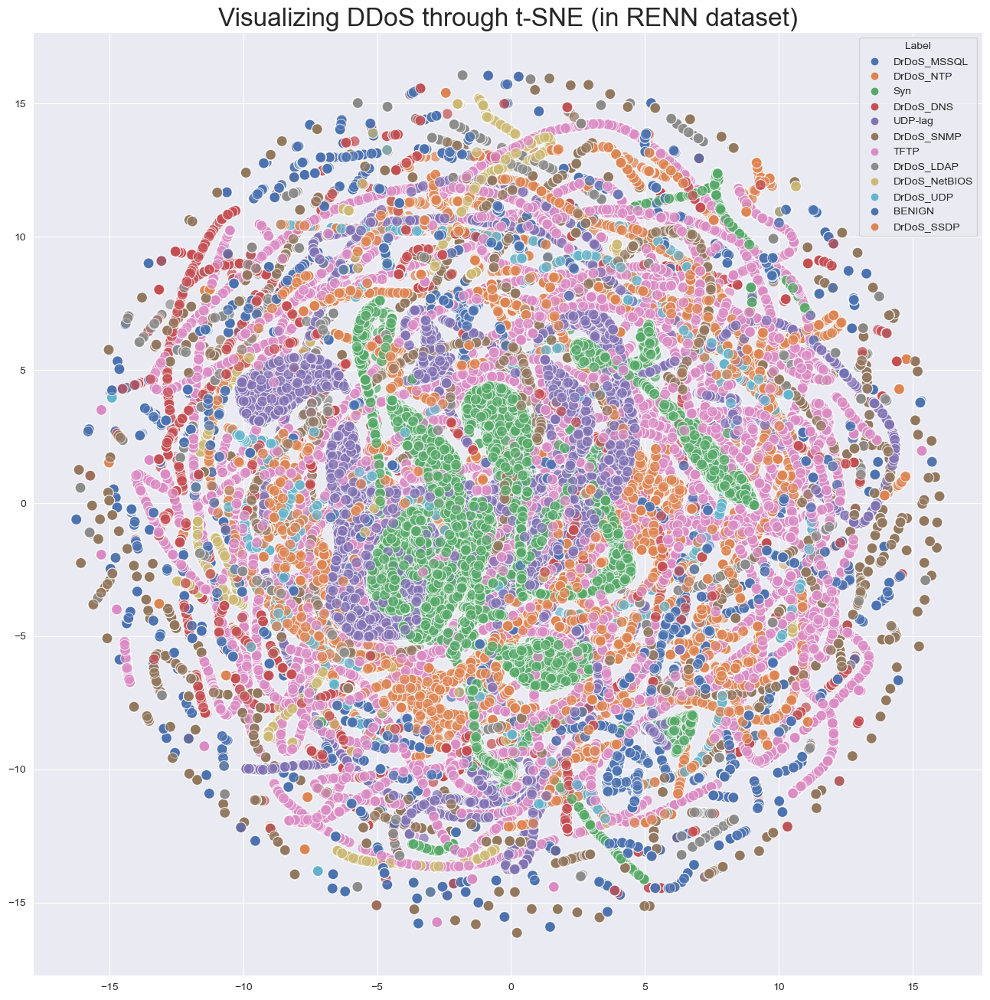

In [70]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

imgPath = "G:\\Brig_Gen_Razzak_Sir_Thesis_Group\\Thesis-on-DDOS-main\\images\\"
imgName = "Visualizing_DDoS_using_PCA_tSNE_in_RENN_dataset.png"

pca = PCA(n_components=0.999)
principalComponents = pca.fit_transform(X_norm)

tsne_ = TSNE(random_state = 23,
             n_components=2,
             verbose=0,
             perplexity=40,
             learning_rate='warn',
             n_iter=500,
             n_jobs=-1).fit_transform(principalComponents)

plt.figure(figsize=(16,16))
sns.scatterplot(x=tsne_[:, 0], y=tsne_[:, 1], s= 100,
                hue=df['Label'],
                cmap='Spectral',alpha=0.7,
                sizes=(20, 200), legend="full",palette="deep")
plt.title('Visualizing DDoS through t-SNE (in RENN dataset)', fontsize=24)
plt.savefig(imgPath+imgName)

before_encoding_dataframe = df.copy(deep=True)
le = preprocessing.LabelEncoder()
df["Label"] = le.fit_transform(df["Label"])
df["Label"] = pd.to_numeric(df['Label'], downcast='integer')

In [37]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score,StratifiedKFold

dt_classifier = DecisionTreeClassifier(criterion="entropy",
                                       min_samples_split=5,
                                       random_state=23,
                                       max_depth=20,
                                       max_features='auto')

sKfold = StratifiedKFold(n_splits=8, shuffle=True, random_state=23)
# Performing cross-validation
scores = cross_val_score(estimator=dt_classifier, X=X,y=y, cv=sKfold, scoring='accuracy',n_jobs=-1,verbose=0)

print("Decision Tree mean accuracy using cross validation of 8 fold: %0.4f " % (scores.mean()))

mean Accuracy of 8 fold: 0.9740 


In [45]:
modelPath = "D:\\Thesis_Group_of_Brig_Gen_Razzak_Sir\\Generated_Models\\"
modelName = "Decision_Tree_model_on_RENN.pkl"

# Fitting the model on the full dataset
dt_classifier.fit(X,y)

joblib.dump(value=dt_classifier,filename=modelPath+modelName)

['D:\\Thesis_Group_of_Brig_Gen_Razzak_Sir\\Generated_Models\\Decision_Tree_model_on_RENN.pkl']

In [55]:
with open(modelPath+modelName,'rb') as f:
    loaded_model = joblib.load(f)

print(dir(loaded_model))

['__abstractmethods__', '__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__getstate__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__setstate__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', '_abc_impl', '_check_feature_names', '_check_n_features', '_estimator_type', '_get_param_names', '_get_tags', '_more_tags', '_prune_tree', '_repr_html_', '_repr_html_inner', '_repr_mimebundle_', '_validate_X_predict', '_validate_data', 'apply', 'ccp_alpha', 'class_weight', 'classes_', 'cost_complexity_pruning_path', 'criterion', 'decision_path', 'feature_importances_', 'feature_names_in_', 'fit', 'get_depth', 'get_n_leaves', 'get_params', 'max_depth', 'max_features', 'max_features_', 'max_leaf_nodes', 'min_impurity_decrease', 'min_samples_leaf', 'min_samples_split', 'min_weight_fraction_leaf',

### plotting decision tree

In [68]:
# %%capture
# for not showing the huge plot inside the notebook
from sklearn import tree
import graphviz

imgPath = "G:\\Brig_Gen_Razzak_Sir_Thesis_Group\\Thesis-on-DDOS-main\\images\\"
imgName = "decision_tree_of_RENN.png"

labels = ["DrDoS_SSDP","DrDoS_UDP","DrDoS_NetBIOS","BENIGN","DrDoS_LDAP","DrDoS_DNS","DrDoS_MSSQL","DrDoS_SNMP","UDP-lag","DrDoS_NTP","Syn","TFTP"]
features = X.columns

# Generate a visualization of the decision tree
dot_data = tree.export_graphviz(decision_tree=dt_classifier,
                                out_file=None,
                                feature_names=features,
                                class_names=labels,
                                filled=True,
                                rounded=True,
                                proportion=True,
                                special_characters=True)
graph = graphviz.Source(dot_data,format='png')
graph
# graph.render(directory=imgPath,filename="Visualizing_DDoS_through_Decision_Tree.png")
#
# # fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4,4), dpi=300)
# fig = plt.figure(figsize=(15,10))
# # plt.figure(figsize=(60, 60))
# # plt.title('Visualizing DDoS through Decision Tree', fontsize=24)
# tree.plot_tree(decision_tree=dt_classifier,
#           feature_names=features,
#           class_names=labels,
#           max_depth=5,
#           rounded=True, # Rounded node edges
#           filled=True, # Adds color according to class
#           proportion=True) # Displays the proportions of class samples instead of the whole number of samples
# fig.savefig(imgPath+imgName)

In [69]:
import gc
gc.collect()

426088